<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ вакансий на hh.ru
   

In [367]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

Как отображать графики на github?

* Обновить версию Jupyter, это можно сделать командой в консоли: NotebookApp.iopub_data_rate_limit
* В аргументе fig.show() прописывать какое-нибудь имя (тогда картинка сохранится). Например, создали график fig, и далее пишем fig.show("img")
* Использовать сервис https://nbviewer.org

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

Чему равна размерность таблицы? 

In [368]:
hh_data = pd.read_csv('data/dst-3.0_16_1_hh_database.csv.zip', sep=';')
hh_data.shape

(44744, 12)

2. Выведите несколько первых (последних строк таблицы), чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [369]:
hh_data

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано
...,...,...,...,...,...,...,...,...,...,...,...,...
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице

Какой тип данных имеют все столбцы?

4. Обратите внимание на информацию о числе непустых значений

In [370]:
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

5. Выведите основную статистическую информацию о столбцах.

Сколько уникальных значений содержится в столбце «Опыт работы»?

Какая из искомых должностей самая распространённая?


In [371]:
hh_data.describe()


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 2010 Московский государств...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [372]:
hh_data['Образование'] = hh_data['Образование и ВУЗ'].apply(lambda x : x.partition(' образование')[0])
hh_data['Образование'].value_counts()

Высшее                 33863
Среднее специальное     5765
Неоконченное высшее     4557
Среднее                  559
Name: Образование, dtype: int64

In [373]:
hh_data.drop('Образование и ВУЗ', axis=1, inplace=True)
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Обновление резюме                44744 non-null  object
 10  Авто                             44744 non-null  object
 11  Образование                      44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

2. Теперь нас интересует столбец **"Пол/возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [374]:
hh_data['Пол'] = hh_data['Пол, возраст'].apply(lambda x : x.split()[0][0])
hh_data['Пол'].value_counts(normalize=True)

М    0.809293
Ж    0.190707
Name: Пол, dtype: float64

In [375]:
s = hh_data['Пол, возраст'][2].split()[2]
hh_data['Возраст'] = hh_data['Пол, возраст'].apply(lambda x : int(x.split()[2]))
hh_data['Возраст'] = hh_data['Возраст'].astype('uint8')
hh_data['Возраст'].mean()

32.19674146254246

In [376]:
hh_data.drop('Пол, возраст', axis=1, inplace=True)
hh_data   .info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   ЗП                               44744 non-null  object
 1   Ищет работу на должность:        44744 non-null  object
 2   Город, переезд, командировки     44744 non-null  object
 3   Занятость                        44744 non-null  object
 4   График                           44744 non-null  object
 5   Опыт работы                      44576 non-null  object
 6   Последнее/нынешнее место работы  44743 non-null  object
 7   Последняя/нынешняя должность     44742 non-null  object
 8   Обновление резюме                44744 non-null  object
 9   Авто                             44744 non-null  object
 10  Образование                      44744 non-null  object
 11  Пол                              44744 non-null  object
 12  Возраст                         

3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-третьих, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [377]:
def get_experience_in_months(arg):
    if arg is np.nan:
        return arg
    
    month_key_words = ['месяц', 'месяцев', 'месяца']
    year_key_words = ['год', 'лет', 'года']
    args_splited = arg.split(' ')[:6]
    month = 0
    year = 0
    for i in range(len(args_splited)):
        if args_splited[i] in month_key_words:
            month = args_splited[i-1]
            
        if args_splited[i] in year_key_words:
            year = args_splited[i-1]
         
    return int(year)*12 + int(month)

hh_data['Опыт работы (месяц)'] = hh_data['Опыт работы'].apply(get_experience_in_months)
hh_data['Опыт работы (месяц)'].median()

100.0

In [378]:
hh_data.drop('Опыт работы', axis=1, inplace=True)
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ЗП                               44744 non-null  object 
 1   Ищет работу на должность:        44744 non-null  object 
 2   Город, переезд, командировки     44744 non-null  object 
 3   Занятость                        44744 non-null  object 
 4   График                           44744 non-null  object 
 5   Последнее/нынешнее место работы  44743 non-null  object 
 6   Последняя/нынешняя должность     44742 non-null  object 
 7   Обновление резюме                44744 non-null  object 
 8   Авто                             44744 non-null  object 
 9   Образование                      44744 non-null  object 
 10  Пол                              44744 non-null  object 
 11  Возраст                          44744 non-null  uint8  
 12  Опыт работы (месяц

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов миллионников:
    
   <code> million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    
    
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [379]:
def define_city(arg):
    """Функция категоризирует город соискателя 

    Args:
        arg (str): Строка, содержащая в себе город соискателя и другие данные

    Returns:
        [str]: Одна из 4 категорий города соискателя
    """
    
    if arg is np.nan:
        return arg
    
    city = arg.split(' , ')[0]
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    
    if city == 'Москва':
        return 'Москва'
    elif city == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    elif city in million_cities:
        return 'город миллионник'
    else:
        return 'другие'
    
hh_data['Город'] = hh_data['Город, переезд, командировки'].apply(define_city)
hh_data['Город'].value_counts(normalize=True) * 100

Москва              37.146880
другие              35.432684
город миллионник    16.386555
Санкт-Петербург     11.033882
Name: Город, dtype: float64

In [380]:
hh_data['Готовность к переезду'] = hh_data['Город, переезд, командировки'].apply(
    lambda s: not(('не готов к переезду' in s) or ('не готова к переезду' in s))
)
hh_data['Готовность к переезду'].value_counts()


False    28719
True     16025
Name: Готовность к переезду, dtype: int64

In [381]:
hh_data['Готовность к командировкам'] = hh_data['Город, переезд, командировки'].apply(
    lambda s: not(('не готов к командировкам' in s) or ('не готова к командировкам' in s))
)
hh_data['Готовность к командировкам'].value_counts()

True     31716
False    13028
Name: Готовность к командировкам, dtype: int64

In [382]:
# Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? 
((hh_data['Готовность к переезду'] & (hh_data['Готовность к командировкам'])).mean() * 100).round()

32.0

In [383]:
hh_data.drop('Город, переезд, командировки', axis=1, inplace=True)
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ЗП                               44744 non-null  object 
 1   Ищет работу на должность:        44744 non-null  object 
 2   Занятость                        44744 non-null  object 
 3   График                           44744 non-null  object 
 4   Последнее/нынешнее место работы  44743 non-null  object 
 5   Последняя/нынешняя должность     44742 non-null  object 
 6   Обновление резюме                44744 non-null  object 
 7   Авто                             44744 non-null  object 
 8   Образование                      44744 non-null  object 
 9   Пол                              44744 non-null  object 
 10  Возраст                          44744 non-null  uint8  
 11  Опыт работы (месяц)              44576 non-null  float64
 12  Город             

5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [384]:
def hh_schedule_one_hot_encoding(hh_schedule):
    """Функция распределяет признак График на заданное количество признаков-мигалок

    Args:
        hh_schedule (str): Признак График соискателя

    Returns:
        [pandas.core.series.Series]: Series признаков-мигалок по признаку Занятость для конкатенации с основными данными
    """
    
    codes = []
    names = ['полный день','сменный график','гибкий график','удаленная работа','вахтовый метод']
    
    for index, value in enumerate(names):
        codes.append(names[index] in hh_schedule)
        
    return pd.Series(codes, index=names)


schedule_encoding = hh_data['График'].apply(hh_schedule_one_hot_encoding)
hh_data = pd.concat([hh_data, schedule_encoding], axis=1)

In [385]:
def hh_employment_one_hot_encoding(hh_employment):
    """Функция распределяет признак Занятость на заданное количество признаков-мигалок

    Args:
        hh_employment (str): Признак Занятость соискателя

    Returns:
        [pandas.core.series.Series]: Series признаков-мигалок по признаку Занятость для конкатенации с основными данными
    """
    codes = []
    names = ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
    
    for index, value in enumerate(names):
        codes.append(names[index] in hh_employment)
    
    return pd.Series(codes, index=names)


employment_encoding = hh_data['Занятость'].apply(hh_employment_one_hot_encoding)
hh_data = pd.concat([hh_data, employment_encoding], axis=1)

In [386]:
# Сколько людей ищут проектную работу или волонтёрство (в обоих столбцах стоит True)?
(hh_data['проектная работа'] & (hh_data['волонтерство'])).value_counts()

False    44308
True       436
dtype: int64

In [387]:
# Сколько людей хотят работать вахтовым методом или с гибким графиком (в обоих столбцах стоит True)?
(hh_data['вахтовый метод'] & (hh_data['гибкий график'])).value_counts()

False    42433
True      2311
dtype: int64

In [388]:
hh_data.drop(['График', 'Занятость'], axis=1, inplace=True)
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ЗП                               44744 non-null  object 
 1   Ищет работу на должность:        44744 non-null  object 
 2   Последнее/нынешнее место работы  44743 non-null  object 
 3   Последняя/нынешняя должность     44742 non-null  object 
 4   Обновление резюме                44744 non-null  object 
 5   Авто                             44744 non-null  object 
 6   Образование                      44744 non-null  object 
 7   Пол                              44744 non-null  object 
 8   Возраст                          44744 non-null  uint8  
 9   Опыт работы (месяц)              44576 non-null  float64
 10  Город                            44744 non-null  object 
 11  Готовность к переезду            44744 non-null  bool   
 12  Готовность к коман

6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [389]:
# подготовка таблицы с курсами валют
rates_data = pd.read_csv('Data/ExchangeRates.csv')
rates_data['date'] = pd.to_datetime(rates_data['date'])
rates_data['currency'] = rates_data['currency'].astype('category')

# разделение ЗП на цифры и валюту
salary_series = hh_data['ЗП'].apply(lambda x: pd.Series(x.split(), index=['ЗП (руб)', 'валюта']))
hh_data = pd.concat([hh_data, salary_series], axis=1)

# подготовка типов данных hh_data
hh_data['Обновление резюме'] = pd.to_datetime(hh_data['Обновление резюме'])
hh_data['ЗП (руб)'] = hh_data['ЗП (руб)'].astype('float64')

# замена валют на целевые
hh_data['валюта'] = hh_data['валюта'].astype('category')
hh_data['валюта'] = hh_data['валюта'].cat.rename_categories({
    'бел.руб.':'BYN',
    'грн.':'UAH',
    'руб.':'RUB',
    'сум':'UZS' 
})

# преобразуем даты к единому виду
hh_data['Обновление резюме'] = hh_data['Обновление резюме'].dt.date
rates_data['date'] = rates_data['date'].dt.date

# объединение таблиц
hh_data = hh_data.merge(rates_data, 
                        how='left', 
                        left_on=['Обновление резюме', 'валюта'], 
                        right_on=['date', 'currency'])
hh_data.fillna(value={'close':1, 'proportion':1}, inplace=True)

# расчёт зарплаты в рублях
hh_data['ЗП (руб)'] = hh_data['ЗП (руб)'] * hh_data['close'] / hh_data['proportion']

In [390]:
# Чему равна медианная заработная плата соискателей в нашей таблице (в рублях)? В ответе укажите целое число тысяч.
hh_data['ЗП (руб)'].median()

59019.0

In [391]:
hh_data.drop(['ЗП', 'валюта', 'currency', 'per', 'date', 'time', 'close', 'vol', 'proportion'], axis=1, inplace=True)
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44744 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44744 non-null  object 
 1   Последнее/нынешнее место работы  44743 non-null  object 
 2   Последняя/нынешняя должность     44742 non-null  object 
 3   Обновление резюме                44744 non-null  object 
 4   Авто                             44744 non-null  object 
 5   Образование                      44744 non-null  object 
 6   Пол                              44744 non-null  object 
 7   Возраст                          44744 non-null  uint8  
 8   Опыт работы (месяц)              44576 non-null  float64
 9   Город                            44744 non-null  object 
 10  Готовность к переезду            44744 non-null  bool   
 11  Готовность к командировкам       44744 non-null  bool   
 12  полный день       

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [392]:
fig = px.histogram(hh_data, x='Возраст', marginal='box', title='Распределение признака "Возраст"')
fig.show()

## Вывод
* Гистограмму распределения возраста можно назвать унимодальной с положительной асимметрией. Мода приходится на возраст в 30 лет.
* На коробчатой диаграмме видно некоторое количество выбросов, причём один далеко отстоющий от всего массива данных. Необходимо дополнительное исследование и скорее всего очистка: возвраст в 100 лет, конечно, возможен, но искать работу в этом возрасте человек вряд ли будет.
* медианное значение приходится на 31 год, нижний и верхний квартили равны 27 и 36 годам соответственно, минимум и максимум 14 и 49 годам соответственно. Выше максимума есть выбросы, подлежащие дополнительному анализу.
* В целом распределение возраста соискателей вполне ожидаемо и более менее соответствует определению трудосопобного возраста человека в России

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [393]:
fig = px.histogram(hh_data, x='Опыт работы (месяц)', marginal='box', title='Распределение признака "Опыт работы"')
fig.show()

## Вывод
Здесь картина уже более интересная, с большим количеством аномалий.
* Гистограмму распределения стажа также можно назвать унимодальной с положительной асимметрией. Пик графика приходится на стаж в 6.5-7 лет, что вполне соответствует моде возраста в 30 лет.
* На коробчатой диаграмме видно большое количество выбросов, причём один далеко отстоющий от всего массива данных. Стаж в 99 лет при максимальном возрасте соискателя в 100 лет является явным выбросом. Но и остальные выбросы за максимумом ящика с усами требуют дополнительного анализа и скорее всего очистки. Как минимум стаж работы необходимо соотнести с возрастом соискателя.
* медианное значение стажа приходится на 8.3 года, нижний и верхний квартили равны 4.7 и 12.8 годам соответственно, минимум и максимум 0 и 24.9 годам соответственно. Выше максимума есть выбросы, подлежащие дополнительному анализу и очистке.
* Распределение стажа работы вызывает больше вопросов, чем данные по возрасту. Необходим дополнительный анализ и сравнение с другими признаками.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [395]:
fig = px.histogram(hh_data, x='ЗП (руб)', marginal='box', title='Распределение признака "Желаемая зарплата"')
fig.show()

In [396]:
hh_data[hh_data['ЗП (руб)'] > 1000000]

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,сменный график,гибкий график,удаленная работа,вахтовый метод,полная занятость,частичная занятость,проектная работа,волонтерство,стажировка,ЗП (руб)
6931,"Программирование, Разработка или Системный адм...","Евразийский банк, АО",Главный специалист Отдел разработки систем роз...,2019-04-22,Не указано,Высшее,М,31,115.0,другие,...,True,True,True,False,True,True,True,False,False,24304876.0
28253,"Руководитель IT проектов, Роботизация, Автомат...",HAMSTER ROBOTICS,Заместитель директора,2019-04-27,Имеется собственный автомобиль,Высшее,М,39,280.0,Москва,...,False,True,True,True,True,True,True,False,False,3000000.0
39191,Специалист по IT,"ТОО ""AMS""",Системный администратор,2019-04-22,Не указано,Среднее специальное,М,29,98.0,другие,...,False,False,False,False,True,False,False,False,False,7675224.0
41924,Project manager,Тинькофф Банк,Технолог автоматизации бизнес-процессов,2019-04-22,Не указано,Неоконченное высшее,М,24,39.0,Москва,...,False,True,True,False,True,True,True,False,False,1750000.0
43134,Chief AI Officer,Finnish Russian Univeristy Cooperation in Tele...,Project Manager in Multimedia Technologies,2018-10-25,Не указано,Высшее,М,38,97.0,Москва,...,False,False,False,False,True,False,False,False,False,2500000.0


In [397]:
fig = px.histogram(hh_data[hh_data['ЗП (руб)'] < 1000000], 
                   x='ЗП (руб)', 
                   marginal='box', 
                   title='Распределение признака "Желаемая зарплата" для зарплат менее 1 000 000 рублей')
fig.show()

## Вывод
Из-за нескольких сильных аномалий график трудночитаемый, поэтому на основном графике можно выявить наличие этих аномалий, а затем построить график, отсекающий аномалии для более подробного анализа.

В итоге имеем 5 записей с желаемой ЗП выше миллиона рублей. Возможно эти люди действительно профессиональны настолько, чтобы получать такие зарплаты, но для нашей модели такие данные явно будут лишними. На этапе очистки данных надо ещё раз проанализировать эти данные и скорее всего удалить.

Далее выводы по графику с отсечением явных аномалий.
* Гистограмму распределения зарплат также можно назвать унимодальной с положительной асимметрией. Пик графика приходится на 50к.
* На коробчатой диаграмме видно большое количество выбросов за максимум, но не все их можно считать аномалиями. Просто количество высокооплачиваемых профессионалов явно меньше всей массы соискателей. Но вслепую этому верить нельзя, необходим анализ.
* На графике видно множество пиков в районе цифр, кратных десяти. Это связано с тем, что при укзаании желаемой зарплаты человек обычно ставит цифру, кратную десяти.
* медианное значение желаемой зарплаты приходится на 59к, нижний и верхний квартили равны 37к и 95к соответственно, минимум и максимум 1к и 180к годам соответственно. Выше максимума есть выбросы, подлежащие дополнительному анализу и очистке.
* Про выбросы за пределы 1000к описано выше, но и на остальные значения необходимо обратить внимание. Причём как на выбросы выше максимума коробчатой диаграммы, так и на значения, близкие к минимальным. Вряд ли человек действительно готов работать за ЗП ниже прожиточного минимума.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [398]:
median_salary = hh_data[hh_data['ЗП (руб)'] < 1000000].groupby(by=['Образование'], as_index=False)['ЗП (руб)'].median()
fig = px.bar(median_salary, 
             x='Образование', 
             y='ЗП (руб)', 
             title='Зависимость признака "Желаемая зарплата" от уровня образования')
fig.show()

## Вывод
На диаграмме рассеивания явно видна взаимосвязь между обраованием и медианной желаемой зарплатой: наибольшие ЗП хотят соискатели с Высшим образованием, наименьший –  со Средним и Средним специальным. Показатели не выбиваются за рамки ожиданий.
При моделировании для расчёта приемлимой зарплаты можно смотреть на уровень образования, но с не очень высоким приоритетом.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [399]:
fig = px.box(hh_data[hh_data['ЗП (руб)'] < 1000000], 
                 x='ЗП (руб)', 
                 y='Город',
                 title='Зависимость признака "Желаемая зарплата" от города')
fig.show()

## Вывод
Ящик с усами наглядно показывает зависимость уровня ожидания зарплаты от города проживания соискателя. В Москве наибольшие ожидания по зарплате, в Санкт-Петербурге поменьше, в городах миллионниках и других городах ещё меньше и примерно равны между собой.
Делаем вывод, что город является важным для анализа признаком.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [400]:
median_salary = hh_data.groupby(['Готовность к переезду', 'Готовность к командировкам'], as_index=False)['ЗП (руб)'].median()
fig = px.bar(median_salary, 
             x='Готовность к переезду', 
             y='ЗП (руб)', 
             color='Готовность к командировкам',
             barmode='group',
             title='Зависимость признака "Желаемая зарплата" от готовности к переезду и командировкам')
fig.show()

## Вывод
Готовность к командировкам и переезду в среднем повышает ожидания по зарплате у соискателей. При этом готовность к командировкам более влияет на ожидаемый уровень зарплат, что в целом понятно: человек больше оторван от дома и у него меньше возможностей проводить время с семьёй.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [401]:
pivot = pd.pivot_table(
    hh_data,
    values='ЗП (руб)',
    index='Образование',
    columns='Возраст',
    aggfunc='median'
)
fig = px.imshow(pivot, title='Зависимость признака "Желаемая зарплата" от уровня образования и возраста')
fig.show()


## Вывод
Данные можно анализировать, опираясь на 4 группы образования:
* Высшее – распределение в целом ожидаемое, с пиком ожидаемой медианной зарплаты в в возрасте между 30 и 45. Но есть и аномалии, как с низким, так и с высоким возрастом. Видимо, некоторые люди указывают не правильное образование и не правильный возраст в надежде получить более высокую зарплату.
* Неоконченное высшее – в этой категории меньший разброс и меньше аномалий, распределение ожидаемое. Но видна аномалия в возрасте 58 лет, стоит обратить внимание.
* Среднее – распределение по всему возрасту более менее одинаковое, с аномалией в возраст е 56 лет. Также видны просадки по ожидаемой зарплате в возрасте 14 лет, что ожидаемо, и в возрасте 55 лет, что странно и требует дополнительного анализа.
* Среднее специальное – распределение по всей длине также ожидаемо ровное, кроме некоторых аномалий в возрасте 65 и 68 лет. Явно не корректные данные, требует внимательного анализа. Также видна странная аномалия на возраст 100 лет, явный кандидат на очистку.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

In [402]:
fig = px.scatter(hh_data, 
                 x='Возраст', 
                 y=hh_data['Опыт работы (месяц)']/12, 
                 labels={'x':'Возраст', 'y':'Опыт работы'},
                 title='Зависимость опыта работы от возраста')
fig.add_shape(type="line",
    x0=1, y0=0, x1=100, y1=100
)
fig.show()

## Вывод
Как и отмечалось ранее, необходимо провести анализ явно некорректных значений, когда соискатель указывает опыт работы больше или близкий к своему возрасту.

Явно аномальных значений оказалось 4 штуки, но и близких друг к другу, а значит тоже подозрительных, ещё 7-10 значений. Они также требуют более внимательного рассмотрения.

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


In [403]:
one_hot_hh = hh_data[['полный день','сменный график','гибкий график','удаленная работа','вахтовый метод','полная занятость',\
    'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']]
fig = px.imshow(one_hot_hh, title='Тепловая карта признаков-мигалок График и Занятость')
fig.show()

## Вывод
По тепловой карте видно, что практически все соискатели ищут работу на полный день и полную занятость.
Наименее привлекательными вариантами работы являются вахтовый метод, волонтёрство и стажировка.

In [404]:
fig = px.box(hh_data, 
                 x='ЗП (руб)', 
                 y='Пол',
                 title='Зависимость признака "Желаемая зарплата" от пола соискателя')
fig.show()

## Вывод
Коробка с усами явно показывает, что соискатели мужского пола в среднем желают более высокую зарплату, чем соискатели-женщины. Причём как в медианном значении, так и в квартильном и максимальном. Это является важным показателем для модели.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [405]:
hh_data.duplicated().value_counts()

False    44583
True       161
dtype: int64

In [406]:
hh_data.drop_duplicates(inplace=True)
hh_data.duplicated().value_counts()

False    44583
dtype: int64

2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [407]:
hh_data.isnull().sum()

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                166
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полный день                          0
сменный график                       0
гибкий график                        0
удаленная работа                     0
вахтовый метод                       0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
ЗП (руб)                             0
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [408]:
hh_data.dropna(subset=['Последнее/нынешнее место работы','Последняя/нынешняя должность'], inplace=True)
hh_data.fillna({'Опыт работы (месяц)':hh_data['Опыт работы (месяц)'].median()}, inplace=True)
hh_data.isnull().sum()

Ищет работу на должность:          0
Последнее/нынешнее место работы    0
Последняя/нынешняя должность       0
Обновление резюме                  0
Авто                               0
Образование                        0
Пол                                0
Возраст                            0
Опыт работы (месяц)                0
Город                              0
Готовность к переезду              0
Готовность к командировкам         0
полный день                        0
сменный график                     0
гибкий график                      0
удаленная работа                   0
вахтовый метод                     0
полная занятость                   0
частичная занятость                0
проектная работа                   0
волонтерство                       0
стажировка                         0
ЗП (руб)                           0
dtype: int64

In [409]:
# # Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков?
hh_data['Опыт работы (месяц)'].mean()

114.35328951795609

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [410]:
cleaned_salary = hh_data[(hh_data['ЗП (руб)'] > 1_000_000) | (hh_data['ЗП (руб)'] < 1_000)]
hh_data.drop(cleaned_salary.index, inplace=True)

# # Сколько выбросов вы нашли?
cleaned_salary.shape

(89, 23)

5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [411]:
work_experience_more_than_age = hh_data[hh_data['Опыт работы (месяц)']/12 > hh_data['Возраст']]
hh_data.drop(work_experience_more_than_age.index, inplace=True)

# # Сколько выбросов вы нашли?
work_experience_more_than_age.shape

(7, 23)

6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**? В какую сторону **асимметрично логарифмическое распределение**? Найдите выбросы с помощью **метода z-отклонения** и удалите их из данных, используйте логарифмический масштаб, сделайте **послабление на 1 сигму (возьмите 4 сигмы)** в сторону, противоположную асимметрии. 

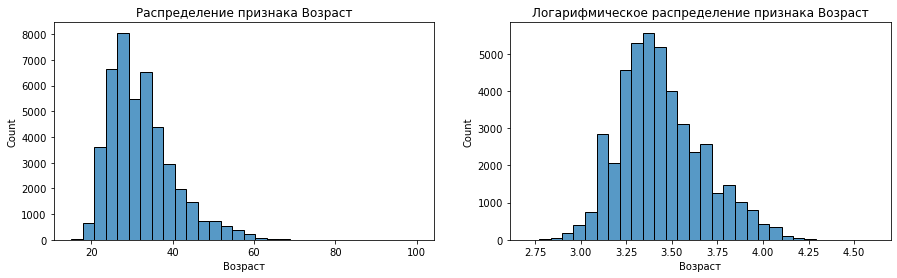

In [412]:
hh_data[hh_data['Возраст'] == 0]

fig, axes = plt.subplots(1, 2, figsize=(15, 4))

#гистограмма исходного признака
histplot = sns.histplot(hh_data['Возраст'], bins=30, ax=axes[0])
histplot.set_title('Распределение признака Возраст');

#гистограмма в логарифмическом масштабе
histplot = sns.histplot(np.log(hh_data['Возраст']) , bins=30, ax=axes[1])
histplot.set_title('Логарифмическое распределение признака Возраст');

## Вывод
По графику видно, что в распределении чаще встречаются значения больше моды. Такая асимметрия называется отрицательной или правосторонней.

In [413]:
def outliers_z_score(data, feature, log_scale=False, left=3, right=3):
    """Функция принимает на вход Dataframe и признак и считает количество выбросов по методу z-отклонения (метод сигм)

    Args:
        data (pandas.core.frame.DataFrame): данные
        feature ([type]): признак
        log_scale (bool, optional): Требуется ли логарифмирование данных. Defaults to False.
        left (int, optional): количество сигм слева. Defaults to 3.
        right (int, optional): количество сигм справа. Defaults to 3.

    Returns:
        tupple: выбросы и очищенные данные
    """
    if log_scale:
        x = np.log(data[feature])
    else:
        x = data[feature]
         
    # mu = x.mean() почему-то получаем результат = inf 0.2311
    mu = np.asarray(x.values).mean()
    sigma = x.std()
    
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    
    return outliers, cleaned

print(f'Число записей до очистки: {hh_data.shape[0]}')
outliers, hh_data = outliers_z_score(hh_data, 'Возраст', log_scale=True, right=4)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {hh_data.shape[0]}')

Число записей до очистки: 44485
Число выбросов по методу z-отклонения: 3
Результирующее число записей: 44482
